# Prepare notebook 

## Install missing libraries and change versions

In [1]:
!pip uninstall -y orbax flax dopamine-rl
!pip install "numba<=0.56.0"
!pip install librosa==0.9.2 timit-utils==0.9.0 torchaudio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install --upgrade tensorflow-addons==0.18.0
!pip install --upgrade tensorflow-probability==0.17.0
!pip install --upgrade tensorflow-io==0.26.0
!pip install --upgrade tensorflow==2.9.1

!pip install -q opencv-python-headless librosa wandb scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Import needed libraries

In [3]:
import os
import pandas as pd
pd.options.mode.chained_assignment = None # avoids assignment warning
import numpy as np
import random
from glob import glob
from tqdm import tqdm 
tqdm.pandas()  # enable progress bars in pandas operations
import gc

import librosa
import sklearn
import json

# Import for visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import librosa.display as lid 
import IPython.display as ipd

# Import tensorflow
import tensorflow as tf
# Set logging level to avoid unnecessary messages
tf.get_logger().setLevel('ERROR') 
# Set autograph verbosity to avoid unnecessary messages
tf.autograph.set_verbosity(0) 
# Enable xla for speed up
tf.config.optimizer.set_jit(True)

# Import required tensorflow modules
import tensorflow_io as tfio
import tensorflow_addons as tfa 
import tensorflow_probability as tfp 
import tensorflow.keras.backend as K 

## Mount Google Drive

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Create CFG class to store all hyperparameters

In [5]:
class CFG:
    
    # Plot training history
    training_plot = True
    
    # Notebook link
    notebook_link = 'kaggle datasets download -d andradaolteanu/gtzan-dataset-music-genre-classification'
    
    # Verbosity level
    verbose = 2
    
    # Device and random seed
    device = 'GPU'
    seed = 42
    
    # Spectrogram size and batch size
    img_size = [64, 1292]
    batch_size = 32
    
    # Drop remainder - dropping last batch if size < batch size
    drop_remainder = True
    
    # TRAINING SETTINGS
    # Number of epochs, and number of folds
    epochs = 30
    fsr = True # reduce stride of stem block
    num_fold = 5
    
    # Selected folds for training and evaluation
    selected_folds = [0]

    # Learning rate, optimizer, and scheduler
    lr = 1e-2
    scheduler = 'cos'
    optimizer = 'Adam' # AdamW, Adam
    
    # Loss function and label smoothing
    loss = 'CCE' # BCE, CCE
    label_smoothing = 0.05 # label smoothing
    
    # AUDIO FILES CONFIGURATION
    duration = 30 # second
    sample_rate = 22050
    audio_len = duration*sample_rate
    
    # STFT parameters 
    # taken from: https://ieeexplore-1ieee-1org-10000470f00e3.wbg2.bg.agh.edu.pl/stamp/stamp.jsp?tp=&arnumber=9778067
    window = 1024
    hop_length = 512
    nfft = 4096
    n_mels=64
    fmin = 0
    fmax = 8000
    normalize = True
    
    # AUGMENTATION CONFIG
    augment=True
    
    # SPECTROGRAM AUGMENTATION
    spec_augment_prob = 0.8
    
    # Mix-Up augmentation
    mixup_prob = 0.65
    mixup_alpha = 0.5
    
    # Cut-Mix augmentation
    cutmix_prob = 0.0
    cutmix_alpha = 0.5
    
    # Frequency and Time masking
    mask_prob = 0.65
    freq_mask = 20
    time_mask = 30


    # AUGIO AUGMENTATION
    audio_augment_prob = 0.5
    
    # Time shift
    timeshift_prob = 0.3
    
    # Gaussian Noise
    gn_prob = 0.35 

    # Data Preprocessing Settings
    labelsMapping = {0: 'blues',
                 1: 'classical',
                 2: 'country',
                 3: 'disco',
                 4: 'hiphop',
                 5: 'jazz',
                 6: 'metal',
                 7: 'pop',
                 8: 'reggae',
                 9: 'rock'}

    class_names = list(labelsMapping.values())
    num_classes = len(class_names)
    class_labels = list(range(num_classes))
    label2name = dict(zip(class_labels, class_names))
    name2label = {v:k for k,v in label2name.items()}
    
    # Paths
    DESTINATION_PATH = "/content/drive/MyDrive/Music-Genres-Classification/"
    DATA_DIRECTORY = DESTINATION_PATH + "Data/"

# Load data

## Unzip

In [6]:
# !unzip -qq /content/drive/MyDrive/Music-Genres-Classification/gtzan.zip -d {CFG.DESTINATION_PATH}

os.listdir(CFG.DATA_DIRECTORY)

['features_3_sec.csv',
 'features_30_sec.csv',
 'genres_original',
 'images_original',
 'audio_files_with_labels.csv']

## Set seeding

In [7]:
def seeding(SEED):
    np.random.seed(SEED)
    random.seed(SEED)
    os.environ['PYTHONHASHSEED'] = str(SEED)
    tf.random.set_seed(SEED)
    print('seeding done!!!')
seeding(CFG.seed)

seeding done!!!


## Prepare filepath | genre dataframe

In [8]:
genres = sorted(os.listdir(CFG.DATA_DIRECTORY + "genres_original"))

df = pd.DataFrame(columns=["filepath", "genre"])

idx = 0
for genre in genres:
  for audio in sorted(os.listdir(CFG.DATA_DIRECTORY + "genres_original/" + genre)):
    new_row = pd.DataFrame({"filepath": CFG.DATA_DIRECTORY + "genres_original/" + genre + "/" + audio,
                            "genre": genre}, 
                           index=[idx])
    idx += 1
    df = pd.concat([df, new_row], ignore_index=True)

df = df[df.filepath != CFG.DATA_DIRECTORY + "genres_original/" + "jazz/jazz.00054.wav"]
df['target'] = df.genre.map(CFG.name2label)
df.to_csv(CFG.DATA_DIRECTORY + "/audio_files_with_labels.csv")

## Check if the path exists

In [9]:
tf.io.gfile.exists(df.filepath.iloc[0])

True

# EDA

## Utils to load and display sample audio, waveform and spectrogram

In [19]:
import cv2

def load_audio(filepath):
    audio, sr = librosa.load(filepath)
    return audio, sr

def get_spectrogram(audio):
    spec = librosa.feature.melspectrogram(y=audio, 
                                          sr=CFG.sample_rate, 
                                          n_mels=CFG.n_mels,
                                          n_fft=CFG.nfft,
                                          hop_length=CFG.hop_length,
                                          # fmax=CFG.fmax,
                                          # fmin=CFG.fmin,
                                   )
    spec = librosa.power_to_db(spec, ref=np.max)
    return spec

def display_audio(row):
    # Caption for viz
    caption = f'Id: {row.filepath} | Genre: {row.genre} | Target: {row.target}'

    # Read audio file
    audio, sr = load_audio(row.filepath)
    # Keep fixed length audio
    audio = audio[:CFG.audio_len]
    # Spectrogram from audio
    spec = get_spectrogram(audio)
    # Display audio
    print("# AUDIO:")
    display(ipd.Audio(audio, rate=CFG.sample_rate))

    print(caption)
    print('# VISUALIZATION:')
    
    fig, ax = plt.subplots(2, 1, figsize=(12, 6), sharex=True, tight_layout=True)

    # Waveplot
    lid.waveshow(audio,
                 sr=CFG.sample_rate,
                 ax=ax[0])
    # Specplot
    lid.specshow(spec, 
                 sr = CFG.sample_rate,
                 hop_length = CFG.hop_length,
                 n_fft=CFG.nfft,
                #  fmin=CFG.fmin,
                #  fmax=CFG.fmax,
                 x_axis = 'time', 
                 y_axis = 'mel',
                 cmap = 'coolwarm',
                 ax=ax[1])
    ax[0].set_xlabel('');

    plt.show()

## Display samples

### Blues

# Category: blues
# Num Samples: 100
# AUDIO:


Id: /content/drive/MyDrive/Music-Genres-Classification/Data/genres_original/blues/blues.00094.wav | Genre: blues | Target: 0
# VISUALIZATION:


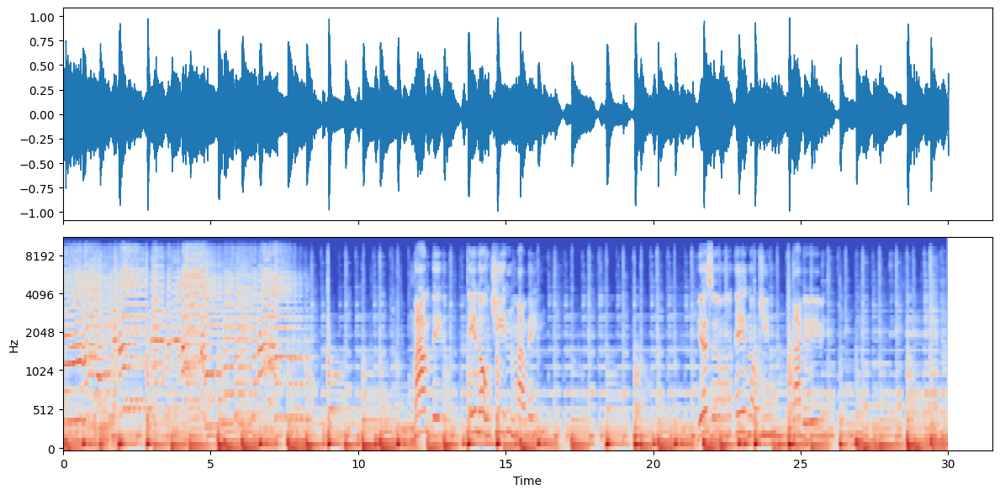

In [20]:
class_name = CFG.class_names[0]
print(f'# Category: {class_name}')
class_df = df.query("genre==@class_name")
print(f'# Num Samples: {len(class_df)}')
row = class_df.sample(1).squeeze()

# Display audio
display_audio(row)

### Classical

# Category: classical
# Num Samples: 100
# AUDIO:


Id: /content/drive/MyDrive/Music-Genres-Classification/Data/genres_original/classical/classical.00058.wav | Genre: classical | Target: 1
# VISUALIZATION:


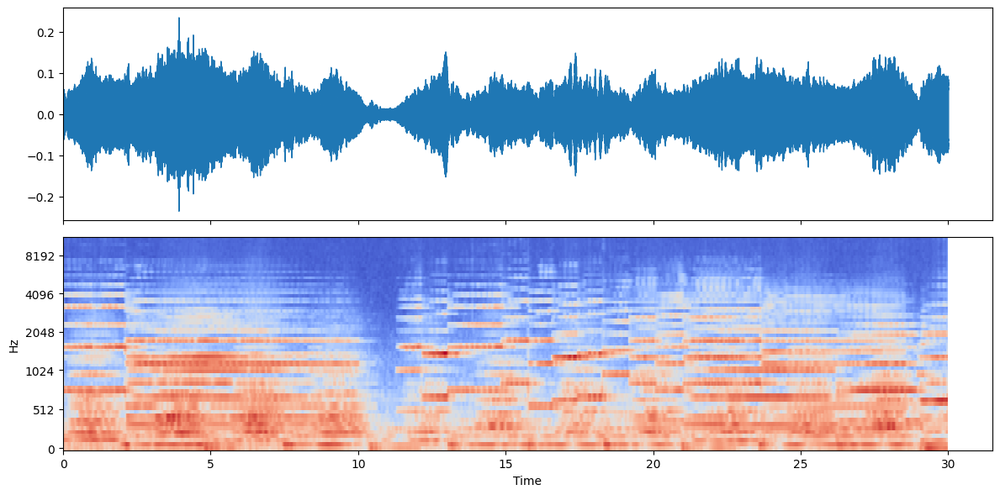

In [21]:
class_name = "classical"
print(f'# Category: {class_name}')
class_df = df.query("genre==@class_name")
print(f'# Num Samples: {len(class_df)}')
row = class_df.sample(1).squeeze()

# Display audio
display_audio(row)

### Hiphop

# Category: hiphop
# Num Samples: 100
# AUDIO:


Id: /content/drive/MyDrive/Music-Genres-Classification/Data/genres_original/hiphop/hiphop.00078.wav | Genre: hiphop | Target: 4
# VISUALIZATION:


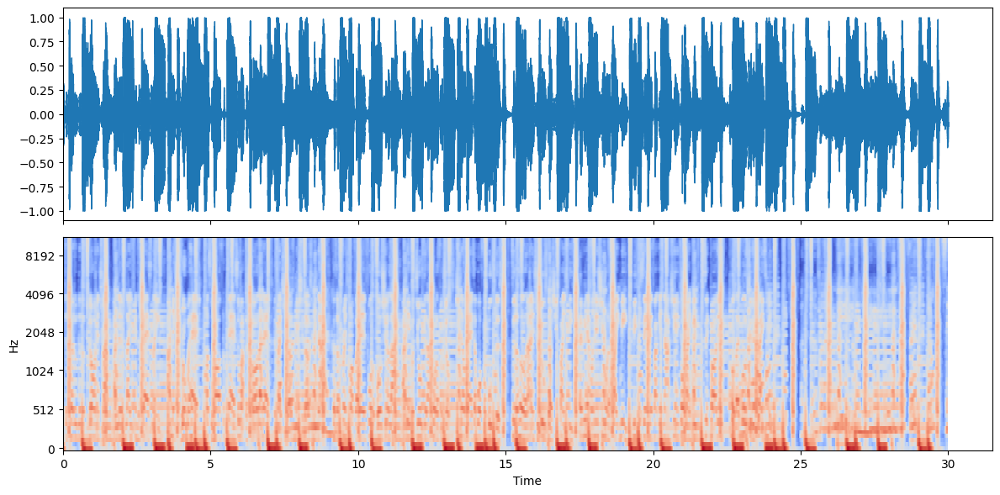

In [22]:
class_name = CFG.class_names[4]
print(f'# Category: {class_name}')
class_df = df.query("genre==@class_name")
print(f'# Num Samples: {len(class_df)}')
row = class_df.sample(1).squeeze()

# Display audio
display_audio(row)

### Rock

# Category: rock
# Num Samples: 100
# AUDIO:


Id: /content/drive/MyDrive/Music-Genres-Classification/Data/genres_original/rock/rock.00080.wav | Genre: rock | Target: 9
# VISUALIZATION:


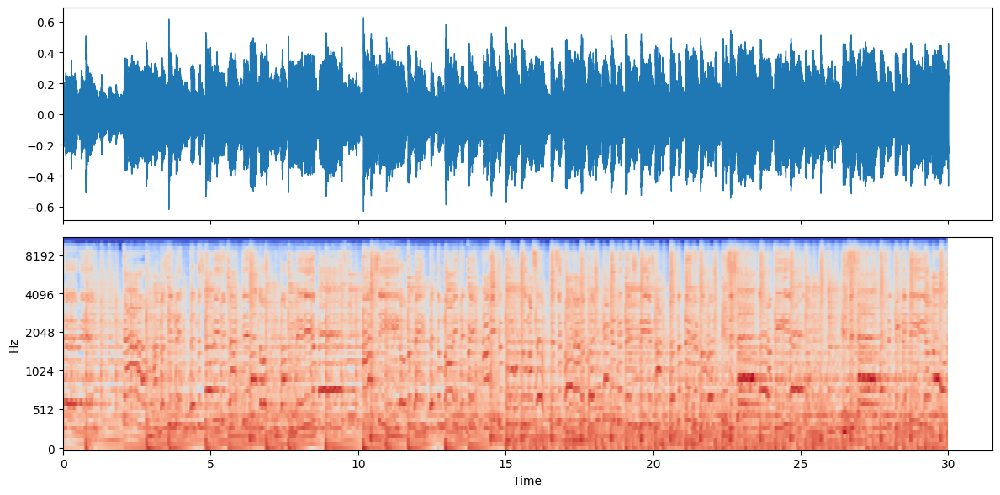

In [23]:
class_name = "rock"
print(f'# Category: {class_name}')
class_df = df.query("genre==@class_name")
print(f'# Num Samples: {len(class_df)}')
row = class_df.sample(1).squeeze()

# Display audio
display_audio(row)

# Split Data into KFolds

## Split data 

In [ ]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=CFG.seed)

df = df.reset_index(drop=True)

df["fold"] = -1

for fold, (train_idx, val_idx) in enumerate(skf.split(df, df['genre'])):
    df.loc[val_idx, 'fold'] = fold

## Check number of songs for each genre for a chosen fold

In [ ]:
df[df["fold"] == 4].groupby("genre").count()

,filepath,target,fold
genre,,,
blues,20,20,20
classical,20,20,20
country,20,20,20
disco,20,20,20
hiphop,20,20,20
jazz,19,19,19
metal,20,20,20
pop,20,20,20
reggae,20,20,20


In [ ]:
df.head()

,filepath,genre,target,fold
0,/content/drive/MyDrive/Music-Genres-Classifica...,blues,0,4
1,/content/drive/MyDrive/Music-Genres-Classifica...,blues,0,2
2,/content/drive/MyDrive/Music-Genres-Classifica...,blues,0,3
3,/content/drive/MyDrive/Music-Genres-Classifica...,blues,0,2
4,/content/drive/MyDrive/Music-Genres-Classifica...,blues,0,2


# Train-Val-Test split

In [ ]:
from sklearn.model_selection import train_test_split

df = df.reset_index(drop=True)

df["split"] = -1

Train, Test = train_test_split(df, test_size=0.3, stratify=df['genre'], random_state=CFG.seed)
Val, Test = train_test_split(Test, test_size=0.33, stratify=Test['genre'], random_state=CFG.seed)

Train["split"] = "train"
Val["split"] = "val"
Test["split"] = "test"

df = pd.concat([Train, Val, Test])

# Augment Data

## Generate random number

In [ ]:
# Generates random integer
def random_int(shape=[], minval=0, maxval=1):
    return tf.random.uniform(shape=shape, minval=minval, maxval=maxval, dtype=tf.int32)


# Generats random float
def random_float(shape=[], minval=0.0, maxval=1.0):
    rnd = tf.random.uniform(shape=shape, minval=minval, maxval=maxval, dtype=tf.float32)
    return rnd

## Augment Audio

In [ ]:
# Import required packages
import tensorflow as tf

# Define a function to crop or pad audio data to a target length
@tf.function
def CropOrPad(audio, target_len, pad_mode='constant'):
    # Get the length of the input audio
    audio_len = audio.shape[0]
    # If the length of the input audio is smaller than the target length, randomly pad the audio
    if audio_len < target_len:
        # Calculate the offset between the input audio and the target length
        diff_len = (target_len - audio_len)
        # Select a random location for padding
        pad1 = random_int([], minval=0, maxval=diff_len)
        # Calculate the second padding value
        pad2 = diff_len - pad1
        pad_len = [pad1, pad2]
        # Apply padding to the audio data
        audio = tf.pad(audio, paddings=[pad_len], mode=pad_mode)
    # If the length of the input audio is larger than the target length, crop the audio
    elif audio_len > target_len:
        # Calculate the difference in length between the input audio and the target length
        diff_len = (audio_len - target_len)
        # Select a random location for cropping
        idx = tf.random.uniform([], 0, diff_len, dtype=tf.int32)
        # Crop the audio data
        audio = audio[idx: (idx + target_len)]
    # Reshape the audio data to the target length
    audio = tf.reshape(audio, [target_len])
    # Return the cropped or padded audio data
    return audio


# Randomly shift audio -> any sound at <t> time may get shifted to <t+shift> time
@tf.function
def TimeShift(audio, prob=0.5):
    # Randomly apply time shift with probability `prob`
    if random_float() < prob:
        # Calculate random shift value
        shift = random_int(shape=[], minval=0, maxval=tf.shape(audio)[0])
        # Randomly set the shift to be negative with 50% probability
        if random_float() < 0.5:
            shift = -shift
        # Roll the audio signal by the shift value
        audio = tf.roll(audio, shift, axis=0)
    return audio

# Apply random noise to audio data
@tf.function
def GaussianNoise(audio, std=[0.0025, 0.025], prob=0.5):
    # Select a random value of standard deviation for Gaussian noise within the given range
    std = random_float([], std[0], std[1])
    # Randomly apply Gaussian noise with probability `prob`
    if random_float() < prob:
        # Add random Gaussian noise to the audio signal
        GN = tf.keras.layers.GaussianNoise(stddev=std)
        audio = GN(audio, training=True) # training=False don't apply noise to data
    return audio

# Applies augmentation to Audio Signal
def AudioAug(audio):
    # Apply time shift and Gaussian noise to the audio signal
    audio = TimeShift(audio, prob=CFG.timeshift_prob)
    audio = GaussianNoise(audio, prob=CFG.gn_prob)
    return audio

# Standardize the audio
@tf.function
def Normalize(data, min_max=True):
    # Compute the mean and standard deviation of the data
    MEAN = tf.math.reduce_mean(data)
    STD = tf.math.reduce_std(data)
    # Standardize the data
    data = tf.math.divide_no_nan(data - MEAN, STD)
    # Normalize to [0, 1]
    if min_max:
        MIN = tf.math.reduce_min(data)
        MAX = tf.math.reduce_max(data)
        data = tf.math.divide_no_nan(data - MIN, MAX - MIN)
    return data

## Augment Spectrogram

In [ ]:
# Convert spectrogram (H,W) to image (H,W,3)
@tf.function
def Spec2Img(spec, num_channels=3):

    if num_channels > 1:
        img = tf.tile(spec[..., tf.newaxis], [1, 1, num_channels])
    else:
        img = spec[..., tf.newaxis]
    return img

# Convert img (H,W,3) to image (H,W)
@tf.function
def Img2Spec(img):
    # Extract 1st channel
    return img[..., 0]


# Randomly mask data in time and freq axis
@tf.function
def TimeFreqMask(spec, time_mask, freq_mask, prob=0.5):
    if random_float() < prob:
        spec = tfio.audio.freq_mask(spec, param=freq_mask)
        spec = tfio.audio.time_mask(spec, param=time_mask)

    return spec


# Applies augmentation to Spectrogram
def SpecAug(spec):
    spec = tf.transpose(Img2Spec(spec), perm=[1, 0])
    spec = TimeFreqMask(spec, time_mask=CFG.time_mask, freq_mask=CFG.freq_mask, prob=0.5)

    spec = tf.transpose(spec, perm=[1, 0])
    spec = Spec2Img(spec)
    return spec

# Compute MixUp Augmentation for Spectrogram
def MixUp(alpha=0.2, prob=0.5):
    """Apply Spectrogram-MixUp augmentaiton. Apply Mixup to one batch and its shifted version"""
    @tf.function
    def apply(specs, labels, alpha=alpha, prob=prob):
        if random_float() > prob:
            return specs, labels

        spec_shape = tf.shape(specs)
        label_shape = tf.shape(labels)

        beta = tfp.distributions.Beta(alpha, alpha)
        lam = beta.sample(1)[0]
        

        specs = lam * specs + (1 - lam) * tf.roll(specs, shift=1, axis=0) 
        labels = lam * labels + (1 - lam) * tf.roll(labels, shift=1, axis=0)

        specs = tf.reshape(specs, spec_shape)
        labels = tf.reshape(labels, label_shape)
        return specs, labels
    return apply


def CutMix(alpha, prob=0.5):
    """Apply Spectrogram-CutMix augmentaiton which only cuts patch across time axis unlike 
       typical Computer-Vision CutMix. Applies CutMix to one batch and its shifted version.
    """
    @tf.function
    def apply(specs, labels, alpha=alpha, prob=prob):
        if random_float() > prob:
            return specs, labels
        spec_shape = tf.shape(specs)
        label_shape = tf.shape(labels)
        W = tf.cast(spec_shape[1], tf.int32)  # [batch, time, freq, channel]

        # Lambda from beta distribution
        beta = tfp.distributions.Beta(alpha, alpha)
        lam = beta.sample(1)[0]
        
        # It's faster to roll the batch by one instead of shuffling it to create image pairs
        specs_rolled = tf.roll(specs, shift=1, axis=0) # specs->[1, 2, 3], specs_rolled->[3, 1, 2]
        labels_rolled = tf.roll(labels, shift=1, axis=0)

        # Select random patch size
        r_x = random_int([], minval=0, maxval=W)
        r = 0.5 * tf.math.sqrt(1.0 - lam)
        r_w_half = tf.cast(r * tf.cast(W, tf.float32), tf.int32)

        # Select random location in time axis
        x1 = tf.cast(tf.clip_by_value(r_x - r_w_half, 0, W), tf.int32)
        x2 = tf.cast(tf.clip_by_value(r_x + r_w_half, 0, W), tf.int32)

        # outer-pad patch -> [0, 0, x, x, 0, 0]
        patch1 = specs[:, x1:x2, :, :]  # [batch, time, freq, channel]
        patch1 = tf.pad(
            patch1, [[0, 0], [x1, W - x2], [0, 0], [0, 0]])  # outer-pad

        # inner-pad-patch -> [y, y, 0, 0, y, y]
        patch2 = specs_rolled[:, x1:x2, :, :]  # [batch, mel, time, channel]
        patch2 = tf.pad(
            patch2, [[0, 0], [x1, W - x2], [0, 0], [0, 0]])  # outer-pad
        patch2 = specs_rolled - patch2  # inner-pad-patch = img - outer-pad-patch
        
        # patch1 -> [0, 0, x, x, 0, 0], patch2 -> [y, y, 0, 0, y, y]
        # cutmix = (patch1 + patch2) -> [y, y, x, x, y, y]
        specs = patch1 + patch2  # cutmix img

        # Compute lambda = [1 - (patch_area/image_area)]
        lam = tf.cast((1.0 - (x2 - x1) / (W)),tf.float32)  # no H term as (y1 - y2) = H
        labels = lam * labels + (1.0 - lam) * labels_rolled  # cutmix label

        specs = tf.reshape(specs, spec_shape)
        labels = tf.reshape(labels, label_shape)

        return specs, labels
    return apply

## Convert Audio to Spectrogram

In [ ]:
# Compute Spectrogram from audio 
@tf.function
def Audio2Spec(audio, spec_shape=CFG.img_size, sr=CFG.sample_rate, nfft=CFG.nfft, window=CFG.window, fmin=0, fmax=8000):
    """
    Computes a Mel-scaled spectrogram from audio using TensorFlow and TensorFlow-IO.
    """
    # Get the desired height and width of the spectrogram
    spec_height = spec_shape[0]
    spec_width = spec_shape[1]
    
    # Get the length of the audio and calculate the hop length for the STFT
    audio_len = tf.shape(audio)[0]
    hop_length = CFG.hop_length # tf.cast((audio_len // (spec_width - 1)), tf.int32) # sample rate * duration / spec width - 1 == 627
    
    # Compute the spectrogram and the Mel-scaled spectrogram using TensorFlow-IO
    spec = tfio.audio.spectrogram(audio, nfft=nfft, window=window, stride=hop_length)
    mel_spec = tfio.audio.melscale(spec, rate=sr, mels=spec_height, fmin=fmin, fmax=fmax) # TODO: ADJUST FMIN FMAX
    
    # Convert the Mel-scaled spectrogram to decibels and transpose it to keep it (mel, time)
    db_mel_spec = tfio.audio.dbscale(mel_spec, top_db=80)
    db_mel_spec = tf.transpose(db_mel_spec, perm=[1, 0])
    
    # If the spectrogram is larger than the desired shape, crop it
    if tf.shape(db_mel_spec)[1] > spec_width:
        db_mel_spec = db_mel_spec[:, :spec_width]
    
    # Reshape the spectrogram to the desired shape and return it
    db_mel_spec = tf.reshape(db_mel_spec, spec_shape)
    return db_mel_spec

## Audio and Spectrogram Decoders

In [ ]:
def audio_decoder(path, label=None, with_labels=True, dim=CFG.audio_len, CFG=CFG):
    def get_audio(filepath):
        file_bytes = tf.io.read_file(filepath)
        audio = tfio.audio.decode_wav(file_bytes, dtype=tf.int16) # decode .ogg file for .wave replace `decode_wav`
        audio = tf.cast(audio, tf.float32)
        audio = tf.squeeze(audio, axis=-1)
        if CFG.normalize:
            audio = Normalize(audio)
        return audio
        
    def get_target(target):          
        target = tf.reshape(target, [1])
        target = tf.cast(tf.one_hot(target, len(CFG.class_labels)), tf.float32) 
        target = tf.reshape(target, [len(CFG.class_labels)])
        return target

    def decode(path):
        audio = get_audio(path)
        audio = CropOrPad(audio, dim) # crop or pad audio to keep a fixed length
        audio = tf.reshape(audio, [dim])
        return audio
    
    def decode_with_labels(path, label):
        label = get_target(label)
        return decode(path), label
    if type(path) == str:
      return decode_with_labels(path, label) if with_labels else decode(path)
    return decode_with_labels(path.numpy(), label.numpy()) if with_labels else decode(path.numpy())


def spec_decoder(with_labels=True, dim=CFG.img_size, CFG=CFG):
    def decode(audio):
        spec = Audio2Spec(audio, spec_shape=dim, sr=CFG.sample_rate, 
                          nfft=CFG.nfft, window=CFG.window, fmin=CFG.fmin,fmax=CFG.fmax)
        
        # Spectrogram (H, W) to Image (H, W, C)
        spec = Spec2Img(spec, num_channels=3) 
        spec = tf.reshape(spec, [*dim, 3])
        return spec
    
    def decode_with_labels(path, label):
        return decode(path), label
    
    return decode_with_labels if with_labels else decode

## Augmenters

Decide wheater to use augmentation for a given sample

In [ ]:
def audio_augmenter(with_labels=True, dim=CFG.audio_len, CFG=CFG):
    def augment(audio, dim=dim):
        if random_float() <= CFG.audio_augment_prob:
            audio = AudioAug(audio)
        audio = tf.reshape(audio, [dim])
        return audio
    
    def augment_with_labels(audio, label):    
        return augment(audio), label
    
    return augment_with_labels if with_labels else augment


def spec_augmenter(with_labels=True, dim=CFG.img_size, CFG=CFG):
    def augment(spec, dim=dim): 
        if random_float() <= CFG.spec_augment_prob:
            spec = SpecAug(spec)
        spec = tf.reshape(spec, [*dim, 3])
        return spec
    
    def augment_with_labels(spec, label):    
        return augment(spec), label
    
    return augment_with_labels if with_labels else augment

# Data Pipeline 

## Specify data pipeline

In [ ]:
def build_dataset(paths, labels=None, batch_size=32, target_size=CFG.img_size, 
                  audio_decode_fn=None, audio_augment_fn=None, 
                  spec_decode_fn=None, spec_augment_fn=None,
                  cache=True, cache_dir="",drop_remainder=False,
                  augment=True, repeat=True, shuffle=100):
    """
    Creates a TensorFlow dataset from the given paths and labels.
    
    Args:
        paths (list): A list of file paths to the audio files.
        labels (list): A list of corresponding labels for the audio files.
        batch_size (int): Batch size for the created dataset.
        target_size (list): A list of target image size for the spectrograms.
        audio_decode_fn (function): A function to decode the audio file.
        audio_augment_fn (function): A function to augment the audio file.
        spec_decode_fn (function): A function to decode the spectrogram.
        spec_augment_fn (function): A function to augment the spectrogram.
        cache (bool): Whether to cache the dataset or not.
        cache_dir (str): Directory path to cache the dataset.
        drop_remainder (bool): Whether to drop the last batch if it is smaller than batch_size.
        augment (bool): Whether to augment the dataset or not.
        repeat (bool): Whether to repeat the dataset or not.
        shuffle (int): Number of elements from the dataset to buffer for shuffling.
        
    Returns:
        ds (tf.data.Dataset): A TensorFlow dataset.
    """
    
    # Create cache directory if cache is enabled
    if cache_dir != "" and cache is True:
        os.makedirs(cache_dir, exist_ok=True)

    # Set default functions if not provided
    if audio_decode_fn is None:
        audio_decode_fn = audio_decoder

    if audio_augment_fn is None:
        audio_augment_fn = audio_augmenter(
            labels is not None, dim=CFG.audio_len, CFG=CFG)

    if spec_decode_fn is None:
        spec_decode_fn = spec_decoder(
            labels is not None, dim=CFG.img_size, CFG=CFG)

    if spec_augment_fn is None:
        spec_augment_fn = spec_augmenter(
            labels is not None, dim=CFG.img_size, CFG=CFG)

    AUTO = tf.data.experimental.AUTOTUNE


    slices = paths if labels is None else (paths, labels)
    
    ds = tf.data.Dataset.from_tensor_slices(slices)
    
    if labels is None:
      ds = ds.map(lambda x: tf.py_function(audio_decoder, [x], [tf.float32]), num_parallel_calls=AUTO)
    else:
      ds = ds.map(lambda x, y: tf.py_function(audio_decoder, [x, y], [tf.float32, tf.float32]), num_parallel_calls=AUTO)


    ds = ds.cache(cache_dir) if cache else ds

    ds = ds.repeat() if repeat else ds

    opt = tf.data.Options()

    if shuffle: 
        ds = ds.shuffle(shuffle, seed=CFG.seed)
        opt.experimental_deterministic = False

    if CFG.device=='GPU':
        opt.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.OFF

    ds = ds.with_options(opt)

    ds = ds.map(audio_augment_fn, num_parallel_calls=AUTO) if augment else ds

    ds = ds.map(spec_decode_fn, num_parallel_calls=AUTO)

    ds = ds.map(spec_augment_fn, num_parallel_calls=AUTO) if augment else ds

    ds = ds.batch(batch_size, drop_remainder=drop_remainder)

    if CFG.mixup_prob and augment and labels is not None:
        ds = ds.map(MixUp(alpha=CFG.mixup_alpha,prob=CFG.mixup_prob),num_parallel_calls=AUTO)

    if CFG.cutmix_prob and augment and labels is not None:
        ds = ds.map(CutMix(alpha=CFG.cutmix_alpha,prob=CFG.cutmix_prob),num_parallel_calls=AUTO)

    ds = ds.prefetch(AUTO)
    return ds

## Utils for Visualization of Augmentation

In [ ]:
def plot_batch(batch, row=3, col=3):
    """Plot one batch data"""
    if isinstance(batch, tuple) or isinstance(batch, list):
        imgs, tars = batch
    else:
        imgs = batch
        tars = None
    plt.figure(figsize=(col*5, row*3))
    for idx in range(row*col):
        ax = plt.subplot(row, col, idx+1)
        lid.specshow(imgs[idx][...,0].numpy(), 
                     sr = CFG.sample_rate, 
                     hop_length = CFG.hop_length,
                     fmin=CFG.fmin,
                     fmax=CFG.fmax,
                     x_axis = 'time', 
                     y_axis = 'mel',
                     cmap = 'coolwarm')
        if tars is not None:
            label = tars[idx].numpy().argmax()
            name = CFG.label2name[label]
            plt.title(name)
    plt.tight_layout()
    plt.show()
    
    
def plot_history(history):
    """Plot trainign history, credit: @cdeotte"""
    epochs = len(history.history['auc'])
    plt.figure(figsize=(15,5))
    plt.plot(np.arange(epochs),history.history['auc'],'-o',label='Train AUC',color='#ff7f0e')
    plt.plot(np.arange(epochs),history.history['val_auc'],'-o',label='Val AUC',color='#1f77b4')
    x = np.argmax( history.history['val_auc'] ); y = np.max( history.history['val_auc'] )
    xdist = plt.xlim()[1] - plt.xlim()[0]; ydist = plt.ylim()[1] - plt.ylim()[0]
    plt.scatter(x,y,s=200,color='#1f77b4'); plt.text(x-0.03*xdist,y-0.13*ydist,'max auc\n%.2f'%y,size=14)
    plt.ylabel('AUC (PR)',size=14); plt.xlabel('Epoch',size=14)
    plt.legend(loc=2)
    plt2 = plt.gca().twinx()
    plt2.plot(np.arange(epochs),history.history['loss'],'-o',label='Train Loss',color='#2ca02c')
    plt2.plot(np.arange(epochs),history.history['val_loss'],'-o',label='Val Loss',color='#d62728')
    x = np.argmin( history.history['val_loss'] ); y = np.min( history.history['val_loss'] )
    ydist = plt.ylim()[1] - plt.ylim()[0]
    plt.scatter(x,y,s=200,color='#d62728'); plt.text(x-0.03*xdist,y+0.05*ydist,'min loss',size=14)
    plt.ylabel('Loss',size=14)
    plt.title('Fold %i - Training Plot'%(fold+1),size=18)
    plt.legend(loc=3)
    plt.show()  

### Visualize not augmented batch

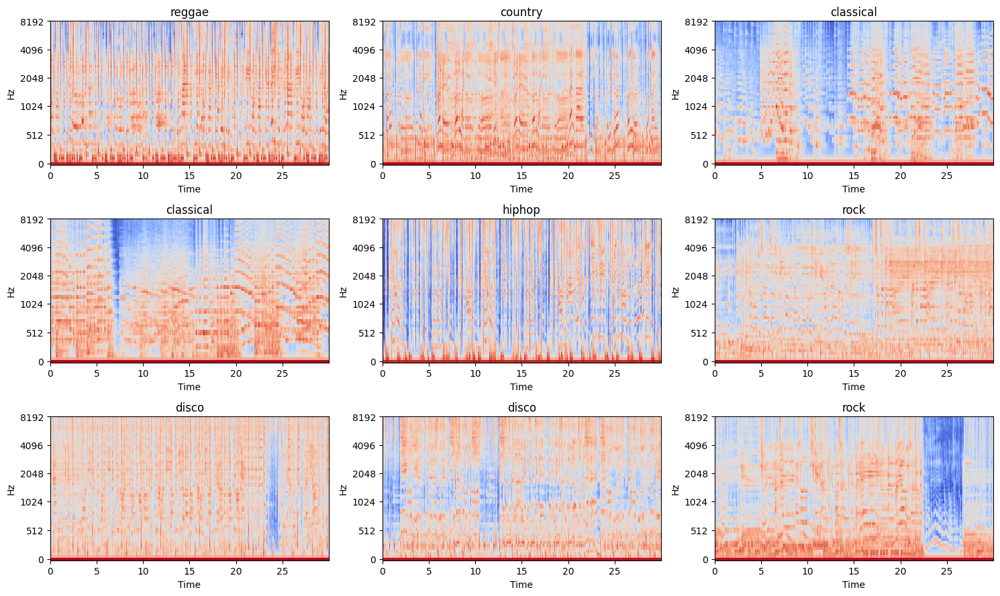

In [ ]:
ds = build_dataset(df.filepath.tolist(), df.target.tolist(), augment=False, cache=False, shuffle=None)
ds = ds.take(100)
imgs, labels = next(iter(ds))
plot_batch((imgs, labels))

### Visualize augmented batch

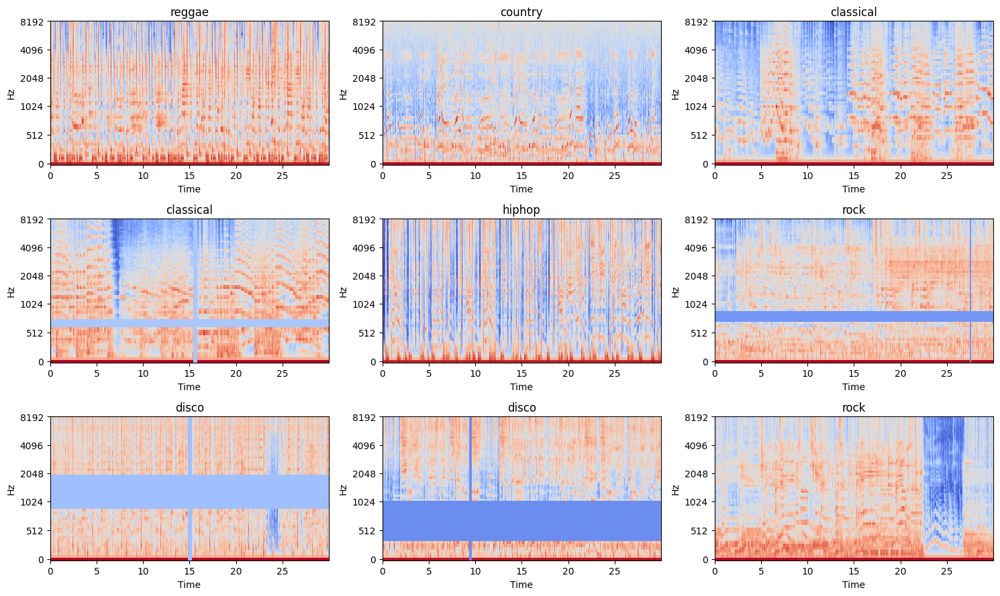

In [ ]:
ds = build_dataset(df.filepath.tolist(), df.target.tolist(), augment=True, cache=False, shuffle=None)
ds = ds.take(100)
imgs, labels = next(iter(ds))
plot_batch((imgs, labels))

# Modelling utils

## Define metrics, loss, optimizers

In [ ]:
import sklearn.metrics

def get_metrics():
    auc = tf.keras.metrics.AUC(curve='PR', name='auc', multi_label=False) # auc on prcision-recall curve
    acc = tf.keras.metrics.CategoricalAccuracy(name='acc')
    return [acc, auc]

def padded_cmap(y_true, y_pred, padding_factor=5):
    num_classes = y_true.shape[1]
    pad_rows = np.array([[1]*num_classes]*padding_factor)
    y_true = np.concatenate([y_true, pad_rows])
    y_pred = np.concatenate([y_pred, pad_rows])
    score = sklearn.metrics.average_precision_score(y_true, y_pred, average='macro',)
    return score

def get_loss():
    if CFG.loss=="CCE":
        loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing=CFG.label_smoothing)
    else:
        raise ValueError("Loss not found")
    return loss
    
def get_optimizer():
    if CFG.optimizer == "Adam":
        opt = tf.keras.optimizers.Adam(learning_rate=CFG.lr)
    else:
        raise ValueError("Optmizer not found")
    return opt

## Create learning rate scheduler callback

In [ ]:
import math

def get_lr_callback(batch_size=8, mode='cos', epochs=CFG.epochs, plot=False):
    """
    Returns a learning rate scheduler callback for a given batch size, mode, and number of epochs.
    """
    # Define the learning rate schedule.
    lr_start   = 0.000005 * 100
    lr_max     = 0.00000140 * batch_size * 100
    lr_min     = 0.000001 * 100
    lr_ramp_ep = 5
    lr_sus_ep  = 0
    lr_decay   = 0.8
   
     def lrfn(epoch):
        if epoch < lr_ramp_ep:
            lr = (lr_max - lr_start) / lr_ramp_ep * epoch + lr_start

        elif epoch < lr_ramp_ep + lr_sus_ep:
            lr = lr_max

        elif CFG.scheduler == 'exp':
            lr = (lr_max - lr_min) * lr_decay**(epoch - \
                  lr_ramp_ep - lr_sus_ep) + lr_min

        elif CFG.scheduler == 'step':
            lr = lr_max * lr_decay**((epoch - lr_ramp_ep - lr_sus_ep) // 2)

        elif CFG.scheduler == 'cos':
            decay_total_epochs = epochs - lr_ramp_ep - lr_sus_ep + 3
            decay_epoch_index = epoch - lr_ramp_ep - lr_sus_ep
            phase = math.pi * decay_epoch_index / decay_total_epochs
            cosine_decay = 0.5 * (1 + math.cos(phase))
            lr = (lr_max - lr_min) * cosine_decay + lr_min
        return lr
    
    if plot:
        plt.figure(figsize=(10,5))
        plt.plot(np.arange(epochs), [lrfn(epoch) for epoch in np.arange(epochs)], marker='o')
        plt.xlabel('epoch'); plt.ylabel('learnig rate')
        plt.title('Learning Rate Scheduler')
        plt.show()
        
    lr_callback = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=False)
    return lr_callback

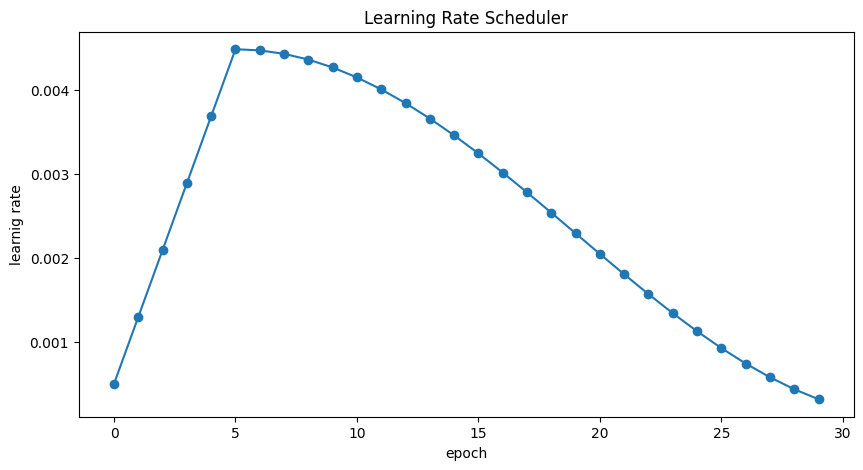

In [ ]:
_=get_lr_callback(CFG.batch_size, plot=True)

## Train-Val-Test Fit function

In [ ]:
def train_val_test_fit(model, df, CFG, model_name="Model"):
    # Split dataset with cv filter
    train_df = df.query("split == 'train'").reset_index(drop=True) 
    valid_df = df.query("split=='val'").reset_index(drop=True) 

    # Get file paths and labels
    train_paths = train_df.filepath.values; train_labels = train_df.target.values
    valid_paths = valid_df.filepath.values; valid_labels = valid_df.target.values


    # Shuffle the file paths and labels
    index = np.arange(len(train_paths))
    np.random.shuffle(index)
    train_paths  = train_paths[index]
    train_labels = train_labels[index]

    # Compute the number of training and validation samples
    num_train = len(train_paths); num_valid = len(valid_paths)
        
    # # Build the training and validation datasets
    cache=True
    train_ds = build_dataset(train_paths, train_labels, 
                              batch_size=CFG.batch_size, cache=cache, shuffle=True,
                            augment=True, drop_remainder=CFG.drop_remainder)
    valid_ds = build_dataset(valid_paths, valid_labels,
                              batch_size=CFG.batch_size, cache=cache, shuffle=False,
                              augment=False, repeat=False, drop_remainder=CFG.drop_remainder)


    # # Print information about the training
    print('#'*25); print('#### FOLD')
    print('#### Image Size: (%i, %i) | Model: %s | Batch Size: %i | Scheduler: %s'%
          (*CFG.img_size, model_name, CFG.batch_size, CFG.scheduler))
    print('#### Num Train: {:,} | Num Valid: {:,}'.format(len(train_paths), len(valid_paths)))

    # # Callbacks
    sv = tf.keras.callbacks.ModelCheckpoint(
        'training_save.h5', monitor='val_auc', verbose=0, save_best_only=True,
        save_weights_only=False, mode='max', save_freq='epoch')
    callbacks = [sv, get_lr_callback(CFG.batch_size)]

    # # Training
    print('# Training')
    history = model.fit(
        train_ds, 
        epochs=CFG.epochs, 
        callbacks=callbacks, 
        steps_per_epoch=len(train_paths)//CFG.batch_size,
        validation_data=valid_ds, 
        # verbose=CFG.verbose,
    )

    return model, history

## Save model and history

In [ ]:
from datetime import datetime
import pickle
MODELS_PATH = "/content/drive/MyDrive/Music-Genres-Classification/Models"

def save_model_and_history(model, history):
  # Create directory with name as current date
  date = str(datetime.now())
  path = os.path.join(MODELS_PATH, date)
  
  # Create directory
  os.mkdir(path)

  # Get model and history paths
  model_path = os.path.join(path, "model.h5")
  history_path = os.path.join(path, "history.pkl")

  # Save model
  model.save(model_path)

  # Save history
  with open(history_path, "wb") as f:
     pickle.dump(history.history, f)

## Load model and history

In [ ]:
def load_model_and_history(newness_number=1, model_directory=None):
  models = sorted(os.listdir(MODELS_PATH))

  if model_directory: 
    model_dir = os.path.join(MODELS_PATH, model_directory) 
  else:
    model_dir = os.path.join(MODELS_PATH, models[-newness_number])

  model = tf.keras.models.load_model(os.path.join(model_dir, "model.h5"))

  with open(os.path.join(model_dir, "history.pkl"), 'rb') as json_file:
    # Load the JSON data as a dictionary
    history = pickle.load(json_file)
  
  return model, history

## Plot learning curve

In [ ]:
def display_accuracy_curve(hist):
  plt.plot(hist["acc"], label="accuracy")
  plt.plot(hist["val_acc"], label="val_accuracy")
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.title("Learning curve")
  plt.legend()
  plt.show()

def display_loss_curve(hist):
  plt.plot(hist["loss"], label="loss")
  plt.plot(hist["val_loss"], label="val_loss")
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title("Learning curve")
  plt.legend()
  plt.show()

def display_auc_curve(hist):
  plt.plot(hist["auc"], label="auc")
  plt.plot(hist["val_auc"], label="val_auc")
  plt.xlabel("Epochs")
  plt.ylabel("AUC")
  plt.title("Learning curve")
  plt.legend()
  plt.show()

## Plot confussion matrix

In [ ]:
import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

## Predict genres

In [ ]:
def predict_genres(model, paths):
  fake_labels = np.zeros(test_paths.shape, dtype=int)
  ds = build_dataset(paths, fake_labels,
                    batch_size=1, cache=False, shuffle=False,
                    augment=False, repeat=False, drop_remainder=False)
  
  preds = model.predict(ds)
  pred_labels = np.argmax(preds, axis=1)

  return pred_labels

# EfficientNet

## Build model

In [ ]:

from tensorflow.keras.applications.efficientnet import EfficientNetB0

def build_model(CFG, compile_model=True):
    """
    Builds and returns a model based on the specified configuration.
    """

    DIM = (None, None)

    # Base - EfficientNetB0              
    base = tf.keras.applications.EfficientNetB0(
      include_top=False,
      weights="imagenet",
      input_shape=(*DIM, 3),
    )

    # Input layer
    inp = tf.keras.layers.Input(shape=(*DIM, 3))

    # Input -> base
    out = base(inp)

    # GAP layer
    out = tf.keras.layers.GlobalAveragePooling2D()(out)

    # Final dense layer for classiciation
    out = tf.keras.layers.Dense(len(CFG.class_names), activation='softmax')(out)

    # Create the TensorFlow model
    model = tf.keras.Model(inputs=inp, outputs=out)
    if compile_model:
        # Optimizer
        opt = get_optimizer()
        # Loss function
        loss = get_loss()
        # Evaluation metrics
        metrics = get_metrics()
        # Compile the model 
        model.compile(optimizer=opt,
                      loss=loss,
                      metrics=metrics)
    return model

In [ ]:
model = build_model(CFG)
base_model_layer_names = [layer.name for layer in model.layers]

for layer_name in base_model_layer_names:
    print(layer_name)

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_average_pooling2d_10  (None, 1280)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_10 (Dense)            (None, 10)                12810     
                                                                 
Total params: 4,062,381
Trainable params: 4,020,358
Non-trainable params: 42,023
_________________________________________________________________
input_22
efficientnetb0
global_average_pooling2d_10
dense_10


## Check output shape

In [ ]:
out = model(imgs, training=False)
print(out.shape)

(32, 10)


## Fit model in KFolds

In [ ]:
oof_pred = []; oof_true = []; oof_val = []; oof_ids = []; oof_folds = [] 

for fold in range(CFG.num_fold):
    # Check if the fold is selected
    if fold not in CFG.selected_folds:
        continue
  
    # Compute batch size and number of samples to drop

    drop_remainder = CFG.drop_remainder
    
    # Split dataset with cv filter

    train_df = df.query("fold!=@fold").reset_index(drop=True) #  | ~cv
    valid_df = df.query("fold==@fold").reset_index(drop=True) #  & cv"

    

    # Get file paths and labels
    train_paths = train_df.filepath.values; train_labels = train_df.target.values
    valid_paths = valid_df.filepath.values; valid_labels = valid_df.target.values

    # Shuffle the file paths and labels
    index = np.arange(len(train_paths))
    np.random.shuffle(index)
    train_paths  = train_paths[index]
    train_labels = train_labels[index]
    


    # Compute the number of training and validation samples
    num_train = len(train_paths); num_valid = len(valid_paths)
        
    # Log the number of training and validation samples if Weights and Biases is being used
    # if CFG.wandb:
    #     wandb.log({'num_train':num_train,
    #                'num_valid':num_valid})
        
    # Build the training and validation datasets
    cache=True
    train_ds = build_dataset(train_paths, train_labels, 
                             batch_size=CFG.batch_size, cache=cache, shuffle=True,
                            drop_remainder=drop_remainder)
    valid_ds = build_dataset(valid_paths, valid_labels,
                             batch_size=CFG.batch_size, cache=cache, shuffle=False,
                             augment=False, repeat=False, drop_remainder=drop_remainder)
    
    # Print information about the fold and training
    print('#'*25); print('#### FOLD', fold + 1)
    print('#### Image Size: (%i, %i) | Model: %s | Batch Size: %i | Scheduler: %s'%
          (*CFG.img_size, "EfficientNet", CFG.batch_size, CFG.scheduler))
    print('#### Num Train: {:,} | Num Valid: {:,}'.format(len(train_paths), len(valid_paths)))
    
    # Clear the session and build the model
    K.clear_session()
    #with strategy.scope():
    model = build_model(CFG)
        
    print('#'*25) 
    
    # Callbacks
    sv = tf.keras.callbacks.ModelCheckpoint(
        'fold-%i.h5'%fold, monitor='val_auc', verbose=0, save_best_only=True,
        save_weights_only=False, mode='max', save_freq='epoch')
    callbacks = [sv, get_lr_callback(CFG.batch_size)]
    # if CFG.wandb:
    #     # wandb callback for logging metrics and media
    #     callbacks.append(WandbCallback)

    # Training
    print('# Training')
    history = model.fit(
        train_ds, 
        epochs=CFG.epochs, 
        callbacks=callbacks, 
        steps_per_epoch=len(train_paths)//CFG.batch_size,
        validation_data=valid_ds, 
        # verbose=CFG.verbose,
    )
    
    # Load best checkpoint
    print('# Loading best model')
    model.load_weights('fold-%i.h5'%fold)
    
    
    # Show training plot
    if CFG.training_plot:
        plot_history(history)
        

## Fit model in TrainValTest

In [ ]:
 # # Clear the session, build and train the model
K.clear_session()
model = build_model(CFG)
model, history = train_val_test_fit(model, df, CFG, model_name="EfficientNet")

#########################
#### FOLD
#### Image Size: (64, 1292) | Model: EfficientNetB0 | Batch Size: 32 | Scheduler: cos
#### Num Train: 699 | Num Valid: 201
# Training
Epoch 1/30
21/21 [==============================] - 296s 11s/step - loss: 1.8435 - acc: 0.4122 - auc: 0.3993 - val_loss: 2.1253 - val_acc: 0.2240 - val_auc: 0.2031 - lr: 5.0000e-04
Epoch 2/30
21/21 [==============================] - 191s 10s/step - loss: 1.5034 - acc: 0.6042 - auc: 0.5617 - val_loss: 1.9315 - val_acc: 0.3281 - val_auc: 0.3497 - lr: 0.0013
Epoch 3/30
21/21 [==============================] - 185s 9s/step - loss: 1.4151 - acc: 0.6711 - auc: 0.5967 - val_loss: 1.9909 - val_acc: 0.3646 - val_auc: 0.3963 - lr: 0.0021
Epoch 4/30
21/21 [==============================] - 176s 9s/step - loss: 1.2986 - acc: 0.6920 - auc: 0.6207 - val_loss: 3.6785 - val_acc: 0.3073 - val_auc: 0.2048 - lr: 0.0029
Epoch 5/30
21/21 [==============================] - 181s 9s/step - loss: 1.2526 - acc: 0.7158 - auc: 0.6184 - val_loss: 

## Save last model and history

In [ ]:
save_model_and_history(model, history)

## Load last model and learning history

In [ ]:
model, hist = load_model_and_history(model_directory="2023-05-24 14:12:31.673830")

## Plot learning curves

### Accuracy

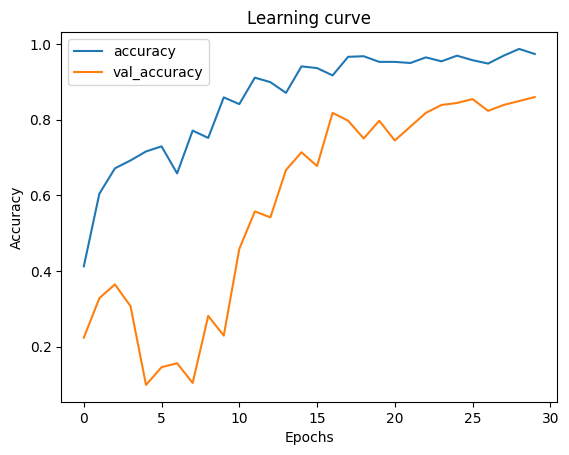

In [ ]:
display_accuracy_curve(hist)

### Loss

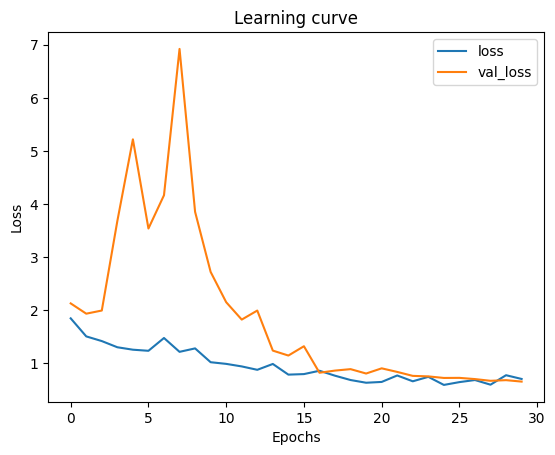

In [ ]:
display_loss_curve(hist)

### AUC

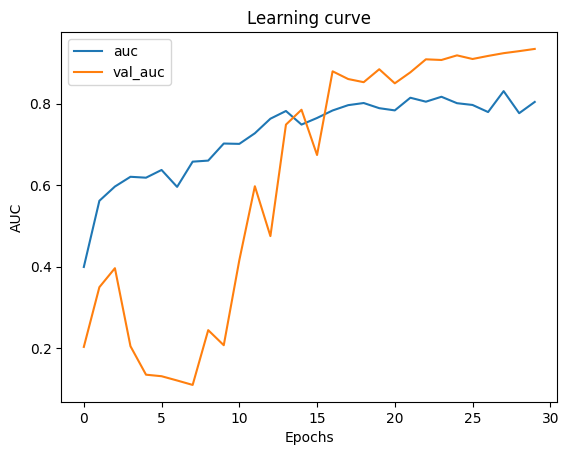

In [ ]:
display_auc_curve(hist)

## Predict on test set

### Load test dataset

In [ ]:
test_df = df.query("split=='test'").reset_index(drop=True)
test_paths = test_df.filepath.values; test_labels = test_df.target.values

test_ds = build_dataset(test_paths, test_labels,
                          batch_size=1, cache=False, shuffle=False,
                          augment=False, repeat=False, drop_remainder=False)

### Predict

In [ ]:
pred_labels = predict_genres(model, test_paths)

99/99 [==============================] - 33s 235ms/step


#### Accuracy score

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(test_labels, pred_labels)

0.8686868686868687

#### Confussion matrix

Confusion matrix, without normalization


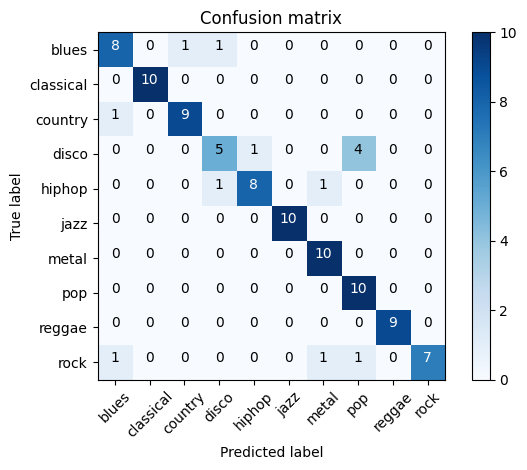

In [ ]:
cm = confusion_matrix(test_labels, pred_labels)
classes = list(CFG.labelsMapping.values())

plot_confusion_matrix(cm, classes)

# ResNet

## Build model

In [ ]:
# import efficientnet.tfkeras as efn
from tensorflow.keras.applications.resnet50 import ResNet50

def build_model_resnet(CFG, compile_model=True):
    """
    Builds and returns a model based on the specified configuration.
    """
  
    DIM = (None, None)

    # Base model - Resnet50
    base = tf.keras.applications.ResNet50(
      include_top=False,
      weights="imagenet",
      input_shape=(*DIM, 3),
    )

    # Input layer 
    inp = tf.keras.layers.Input(shape=(*DIM, 3))

    # Input -> base 
    out = base(inp)

    # GAP Layer
    out = tf.keras.layers.GlobalAveragePooling2D()(out)

    # Final dense layer for classification
    out = tf.keras.layers.Dense(len(CFG.class_names), activation='softmax')(out)

    # Create the TensorFlow model 
    model = tf.keras.Model(inputs=inp, outputs=out)
    if compile_model:
        # Optimizer
        opt = get_optimizer()
        # Loss function
        loss = get_loss()
        # Evaluation metrics
        metrics = get_metrics()
        # Compile the model 
        model.compile(optimizer=opt,
                      loss=loss,
                      metrics=metrics)
    
    return model

In [ ]:
def build_model_resnet_with_added_conv(CFG, compile_model=True):
    """
    Builds and returns a model based on the specified configuration.
    """
    
    DIM = (None, None)

    # Base model - Resnet50
    base = tf.keras.applications.ResNet50(
      include_top=False,
      weights="imagenet",
      input_shape=(*DIM, 3),
    )
    
    # Input layer
    inp = tf.keras.layers.Input(shape=(*DIM, 3))

    # Input -> base
    out = base(inp)

    # Additional Conv2D layer
    out = tf.keras.layers.Conv2D(128, kernel_size=(3, 3), activation="relu", padding="same")(out)

    # GAP Layer
    out = tf.keras.layers.GlobalAveragePooling2D()(out)

    # Final dense layer for classification
    out = tf.keras.layers.Dense(len(CFG.class_names), activation='softmax')(out)

    # Create the TensorFlow model 
    model = tf.keras.Model(inputs=inp, outputs=out)
    if compile_model:
        # Optimizer
        opt = get_optimizer()
        # Loss function
        loss = get_loss()
        # Evaluation metrics
        metrics = get_metrics()
        # Compile the model 
        model.compile(optimizer=opt,
                      loss=loss,
                      metrics=metrics)
    
    return model

In [ ]:
m = build_model_resnet_with_added_conv(CFG)

In [ ]:
m.summary()

Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 conv2d_3 (Conv2D)           (None, None, None, 128)   2359424   
                                                                 
 global_average_pooling2d_6   (None, 128)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_6 (Dense)             (None, 10)                1290      
                                                                 
Total params: 25,948,426
Trainable params: 25,895,306
Non-trainable params: 53,120
_________________________________________

## Fit model

In [ ]:
K.clear_session()
model = build_model_resnet_with_added_conv(CFG)
model, history = train_val_test_fit(model, df, CFG, model_name="ResNet")

#########################
#### FOLD
#### Image Size: (64, 1292) | Model: ResNet | Batch Size: 32 | Scheduler: cos
#### Num Train: 699 | Num Valid: 201
# Training
Epoch 1/30
21/21 [==============================] - 303s 12s/step - loss: 2.4059 - acc: 0.3408 - auc: 0.3125 - val_loss: 2.9834 - val_acc: 0.2344 - val_auc: 0.1591 - lr: 5.0000e-04
Epoch 2/30
21/21 [==============================] - 181s 9s/step - loss: 1.7687 - acc: 0.5104 - auc: 0.4717 - val_loss: 13.8394 - val_acc: 0.1042 - val_auc: 0.1004 - lr: 0.0013
Epoch 3/30
21/21 [==============================] - 177s 9s/step - loss: 1.6654 - acc: 0.5312 - auc: 0.4951 - val_loss: 14.6247 - val_acc: 0.0885 - val_auc: 0.0971 - lr: 0.0021
Epoch 4/30
21/21 [==============================] - 171s 9s/step - loss: 1.5576 - acc: 0.6086 - auc: 0.5531 - val_loss: 7.2325 - val_acc: 0.0938 - val_auc: 0.1039 - lr: 0.0029
Epoch 5/30
21/21 [==============================] - 174s 9s/step - loss: 1.5493 - acc: 0.5744 - auc: 0.5261 - val_loss: 14.4425

## Save model

In [ ]:
save_model_and_history(model, history)

## Load model

In [ ]:
model_resnet, hist_resnet = load_model_and_history(model_directory="2023-05-24 16:00:34.599873")

In [ ]:
model_resnet.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
Total params: 23,608,202
Trainable params: 23,555,082
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:
for elem in model_resnet.get_layer('resnet50').layers:
  print(elem.name)

input_1
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_bn
conv3_

In [ ]:
model_resnet.get_layer('resnet50').get_layer('conv5_block3_out').output

<KerasTensor: shape=(None, None, None, 2048) dtype=float32 (created by layer 'conv5_block3_out')>

## Plot learning curves

### Accuracy

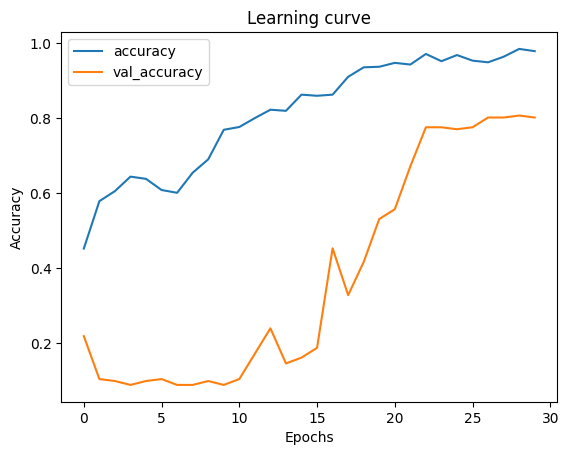

In [ ]:
display_accuracy_curve(hist_resnet)

### Loss

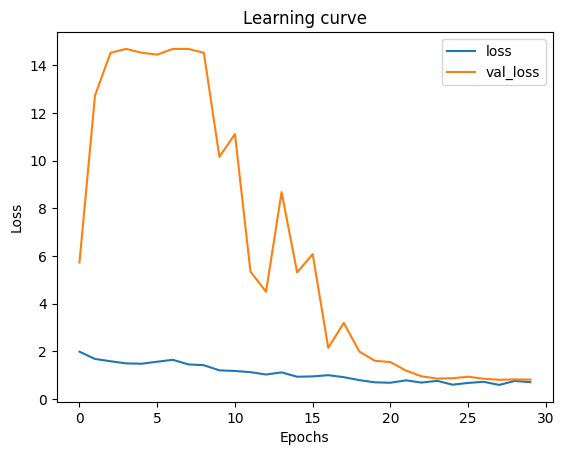

In [ ]:
display_loss_curve(hist_resnet)

### AUC

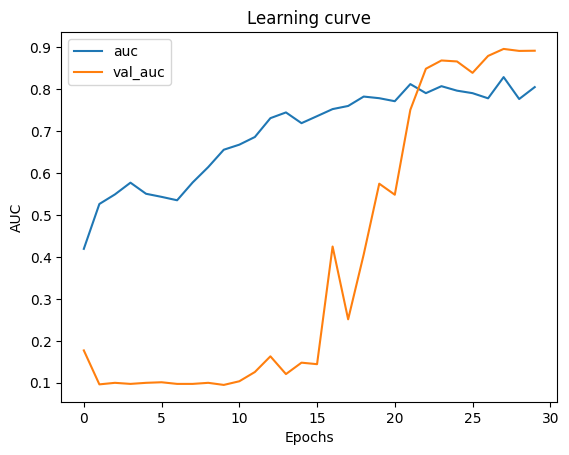

In [ ]:
display_auc_curve(hist_resnet)

## Predict on test set

### Load test dataset

In [ ]:
test_df = df.query("split=='test'").reset_index(drop=True)
test_paths = test_df.filepath.values; test_labels = test_df.target.values

test_ds = build_dataset(test_paths, test_labels,
                          batch_size=1, cache=False, shuffle=False,
                          augment=False, repeat=False, drop_remainder=False)

### Predict

In [ ]:
pred_labels = predict_genres(model_resnet, test_paths)

#### Accuracy score

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(test_labels, pred_labels)

0.8383838383838383

#### Confussion matrix

Confusion matrix, without normalization


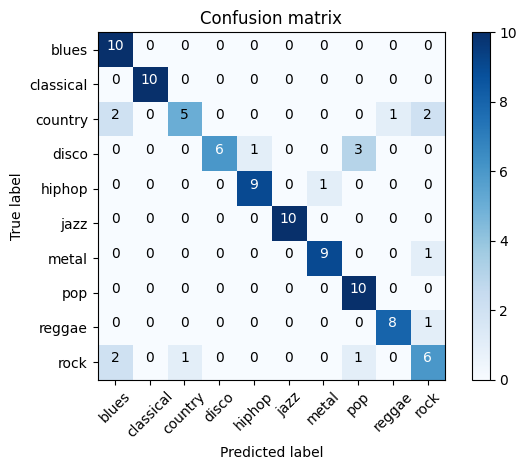

In [ ]:
cm = confusion_matrix(test_labels, pred_labels)
classes = list(CFG.labelsMapping.values())

plot_confusion_matrix(cm, classes)

# Mine

## Build Model

In [ ]:
def build_my_model(compile_model=True):
    # Input layer
    input_layer = tf.keras.layers.Input(shape=(64, 1292, 3))

    # Convolutional layer 1
    conv1 = tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu')(input_layer)
    dropout1 = tf.keras.layers.Dropout(0.3)(conv1)
    batchnorm1 = tf.keras.layers.BatchNormalization()(dropout1)
    maxpool1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(batchnorm1)

    # Convolutional layer 1
    conv1 = tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu')(input_layer)
    dropout1 = tf.keras.layers.Dropout(0.3)(conv1)
    batchnorm1 = tf.keras.layers.BatchNormalization()(dropout1)
    maxpool1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(batchnorm1)

    # Convolutional layer 2
    conv2 = tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu')(maxpool1)
    dropout2 = tf.keras.layers.Dropout(0.2)(conv2)
    batchnorm2 = tf.keras.layers.BatchNormalization()(dropout2)
    maxpool2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(batchnorm2)

    # Convolutional layer 3
    conv3 = tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu')(maxpool2)
    dropout3 = tf.keras.layers.Dropout(0.2)(conv3)
    batchnorm3 = tf.keras.layers.BatchNormalization()(dropout3)
    maxpool3 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(batchnorm3)

    # Flatten the output of the previous layer
    flatten = tf.keras.layers.Flatten()(maxpool3)

    # Fully connected layers
    dense1 = tf.keras.layers.Dense(units=128, activation='relu')(flatten)
    dense2 = tf.keras.layers.Dense(units=64, activation='relu')(dense1)

    # Output layer with softmax activation for classification
    output_layer = tf.keras.layers.Dense(units=10, activation='softmax')(dense2)

    # Create the model
    modelCNN = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

    # Compile the model with categorical cross-entropy loss and Adam optimizer
    if compile_model:
        # Set the optimizer
        opt = get_optimizer()
        # Set the loss function
        loss = get_loss()
        # Set the evaluation metrics
        metrics = get_metrics()
        # Compile the model with the specified optimizer, loss function, and metrics
        modelCNN.compile(optimizer=opt,
                      loss=loss,
                      metrics=metrics)

    return modelCNN

In [ ]:
model = build_my_model()

model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 64, 1292, 3)]     0         
                                                                 
 conv2d_1 (Conv2D)           (None, 62, 1290, 32)      896       
                                                                 
 dropout_1 (Dropout)         (None, 62, 1290, 32)      0         
                                                                 
 batch_normalization_1 (Batc  (None, 62, 1290, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 31, 645, 32)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 29, 643, 64)       1849

## Fit model 

In [ ]:
 # # Clear the session, build and train the model
K.clear_session()
model_cnn = build_my_model(CFG)
model_cnn, history = train_val_test_fit(model_cnn, df, CFG, model_name="ResNet")

NameError: ignored

# Saliency maps



## Get last layer names

In [ ]:
last_conv_layer_name_resnet = "conv2d" # "conv5_block3_3_conv"

## Grad-CAM

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from tensorflow.keras.utils import img_to_array, array_to_img

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    img_array = np.expand_dims(img_array, axis=0)

    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_array, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = img_array
    # img = keras.preprocessing.image.load_img(img_path)
    # img = keras.preprocessing.image.img_to_array(img)

    #img = cv2.resize(img, [150, 150])
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    
    superimposed_img = array_to_img(superimposed_img)
    return superimposed_img, img

    # # Save the superimposed image
    # superimposed_img.save(cam_path)

    # # Display Grad CAM
    # return Image(cam_path)

### ResNet

In [ ]:
model_resnet, hist_resnet = load_model_and_history(model_directory="2023-05-31 14:02:35.553126")

model_resnet.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 conv2d (Conv2D)             (None, None, None, 128)   2359424   
                                                                 
 global_average_pooling2d (G  (None, 128)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 10)                1290      
                                                                 
Total params: 25,948,426
Trainable params: 25,895,306
Non-trainable params: 53,120
____________________________________________

#### Util - Process audio, spectrogram

In [ ]:
def preprocess_audio(path):
  file_bytes = tf.io.read_file(path)
  audio = tfio.audio.decode_wav(file_bytes, dtype=tf.int16) 
  audio = tf.cast(audio, tf.float32)
  audio = tf.squeeze(audio, axis=-1)
  if CFG.normalize:
      audio = Normalize(audio)

  audio = CropOrPad(audio, CFG.audio_len) 
  audio = tf.reshape(audio, [CFG.audio_len])

  return audio

def preprocess_spectrogram(audio):
  spec = Audio2Spec(audio, spec_shape=CFG.img_size, sr=CFG.sample_rate, 
                          nfft=CFG.nfft, window=CFG.window, fmin=CFG.fmin,fmax=CFG.fmax)

  spec = Spec2Img(spec, num_channels=3) 
  spec = tf.reshape(spec, [*CFG.img_size, 3])

  return spec

#### Util - Show spectrogram

In [ ]:
def show_spectrogram(spectrogram_tensor):

    if isinstance(spectrogram_tensor,np.ndarray):
      lid.specshow(spectrogram_tensor[...,0], 
                      sr = CFG.sample_rate, 
                      hop_length = CFG.hop_length,
                      fmin=CFG.fmin,
                      fmax=CFG.fmax,
                      x_axis = 'time', 
                      y_axis = 'mel',
                      cmap = 'coolwarm')
    else:
      lid.specshow(spectrogram_tensor[...,0].numpy(), 
                      sr = CFG.sample_rate, 
                      hop_length = CFG.hop_length,
                      fmin=CFG.fmin,
                      fmax=CFG.fmax,
                      x_axis = 'time', 
                      y_axis = 'mel',
                      cmap = 'coolwarm')


#### Create function to compare spectrogram with CAM result

In [ ]:
from PIL import Image

def display_cam_spectrogram(cam_image, image, main_title):
  
  # Create suptitle
  fig, axs = plt.subplots(1, 2, figsize=(15, 5))
  plt.suptitle(f"Music genre: {main_title}")

  # Stretch CAM Image
  stretched_image = cam_image.resize((500, 350))
  
  # Stretch Spectrogram, add Colormap
  image_rgb = image.convert("RGB")
  image_array = np.array(image_rgb)

  colormap = matplotlib.colormaps["coolwarm"]
  colored_image_array = colormap(image_array[:, :, 0] / 255.0)  # Normalize the red channel

  colored_image = Image.fromarray((colored_image_array[:, :, :3] * 255).astype(np.uint8))

  # Display or save the colored image
  axs[0].imshow(colored_image.resize((500, 350)).rotate(180).transpose(Image.FLIP_LEFT_RIGHT))
  axs[0].set_title("Input Spectrogram")

  axs[1].imshow(stretched_image.rotate(180).transpose(Image.FLIP_LEFT_RIGHT))
  axs[1].set_title("CAM Visualization")

  plt.show()

#### Choose random song from test set

In [ ]:
random_test_data = df.query("split == 'train'").query("genre == 'rock'").sample(1).squeeze()

random_test_path = random_test_data["filepath"]
random_test_label = random_test_data["target"]

print(f"Song: {random_test_path}. Label: {random_test_label}")

Song: /content/drive/MyDrive/Music-Genres-Classification/Data/genres_original/rock/rock.00018.wav. Label: 9


#### Process audio, process and display spectrogram

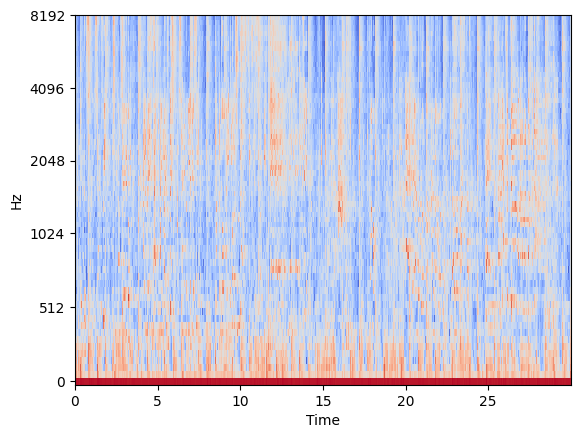

In [ ]:
audio = preprocess_audio(random_test_path)
spec = preprocess_spectrogram(audio)
show_spectrogram(spec)

#### Predict

In [ ]:
prediction_resnet = model_resnet.predict(np.expand_dims(spec, axis=0), verbose=0)

print(f"Resnet -- {CFG.labelsMapping[np.argmax(prediction_resnet)]} -- probability={np.max(prediction_resnet)}")

Resnet -- rock -- probability=0.8635425567626953


#### Heatmap and Grad-CAM

In [ ]:
heatmap_resnet = make_gradcam_heatmap(spec, model_resnet, last_conv_layer_name_resnet)
gradcam_resnet, image = save_and_display_gradcam(spec, heatmap_resnet)

<ipython-input-85-1281a0e3fe68>:54: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


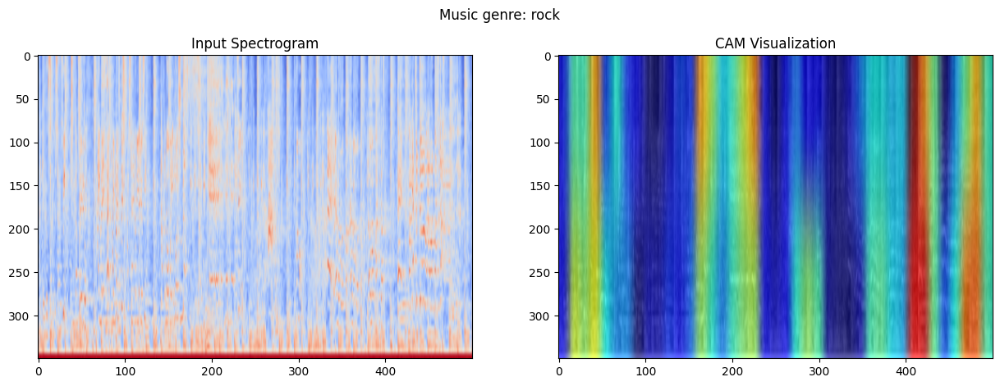

In [ ]:
OldRange = (np.max(image) - np.min(image))  
NewRange = 255 - 0
image = (((image - np.min(image)) * NewRange) / OldRange) + 0

display_cam_spectrogram(gradcam_resnet, 
                        Image.fromarray(image.numpy().astype(np.uint8)), 
                        CFG.labelsMapping[np.argmax(prediction_resnet)])

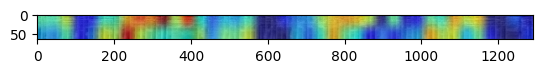

In [ ]:
plt.imshow(gradcam_resnet)

#### Visualize

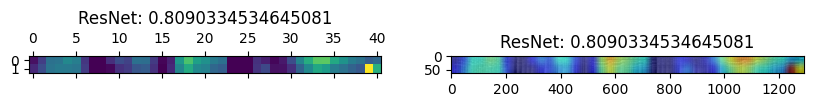

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5))
axs[0].matshow(heatmap_resnet)
axs[0].set_title(f"ResNet: {np.max(prediction_resnet)}")

axs[1].imshow(gradcam_resnet)
axs[1].set_title(f"ResNet: {np.max(prediction_resnet)}")

plt.show()

### CAM

#### Functions used for CAM

In [ ]:
import numpy as np
import cv2
from keras import backend as K
import matplotlib.cm as cm
import matplotlib
from tensorflow.keras.utils import img_to_array, array_to_img

def get_class_activation_map(model, img,  last_conv_layer_name):
    ''' 
    this function computes the class activation map
    
    Inputs:
        1) model (tensorflow model) : trained model
        2) img (numpy array of shape (224, 224, 3)) : input image
    '''
    
    # expand dimension - create batch of one image
    img = np.expand_dims(img, axis=0)

    # predict the top class and get it's label
    predictions = model.predict(img, verbose=0)
    label_index = np.argmax(predictions)
    
    # Get the input weights to the softmax of all classes and then for the winning class.
    class_weights = model.layers[-1].get_weights()[0] # shape (num_of_neurons_in_dense, num_classes)
    class_weights_winner = class_weights[:, label_index] # (num_of_neurons_in_dense, )

    # Get last Convolutional layer
    final_conv_layer = model.get_layer(last_conv_layer_name)

    # Get all filters from last Conv layer (1, filt_size, filt_size, num_of_neurons)
    get_output = K.function([model.layers[0].input],[final_conv_layer.output, model.layers[-1].output])
    [conv_outputs, predictions] = get_output([img])
    
    # Squeeze conv map to shape image to size (filt_size, filt_size, num_of_neurons)
    conv_outputs = np.squeeze(conv_outputs)

    # get class activation map for object class that is predicted to be in the image - multiply weights, maps and sum
    final_output = np.dot(cv2.resize(conv_outputs, dsize=(150, 150), interpolation=cv2.INTER_CUBIC), class_weights_winner).reshape(150,150) # dim: 224 x 224
    
    # return class activation map
    return final_output, label_index

def save_and_display_cam(img_array, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = img_array
    # img = keras.preprocessing.image.load_img(img_path)
    # img = keras.preprocessing.image.img_to_array(img)

    #img = cv2.resize(img, [150, 150])
    # Rescale heatmap to a range 0-255
    OldRange = (np.max(heatmap) - np.min(heatmap))  
    NewRange = 255 - 0
    heatmap = (((heatmap - np.min(heatmap)) * NewRange) / OldRange) + 0
    heatmap = np.uint8(heatmap)

    # Use jet colormap to colorize heatmap
    jet = matplotlib.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    
    superimposed_img = array_to_img(superimposed_img)
    return superimposed_img, array_to_img(img)



#### Choose random song from test set

In [ ]:
random_test_data = df.query("split == 'train'").query("genre == 'pop'").sample(1).squeeze()

random_test_path = random_test_data["filepath"]
random_test_label = random_test_data["target"]

print(f"Song: {random_test_path}. Label: {random_test_label}")

Song: /content/drive/MyDrive/Music-Genres-Classification/Data/genres_original/pop/pop.00042.wav. Label: 7


#### Process audio, process and display spectrogram

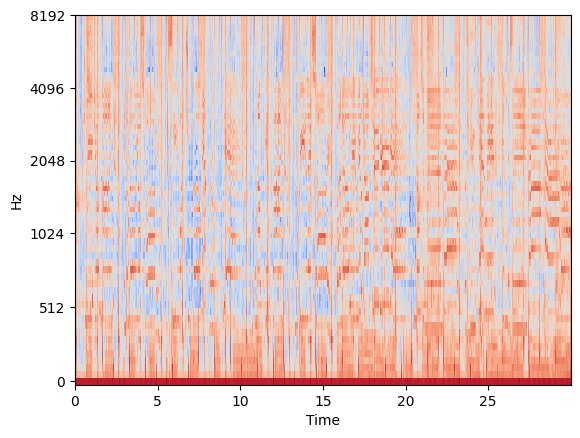

In [ ]:
audio = preprocess_audio(random_test_path)
spec = preprocess_spectrogram(audio)
show_spectrogram(spec)

#### Predict

In [ ]:
prediction_resnet = model_resnet.predict(np.expand_dims(spec, axis=0), verbose=0)

print(f"Resnet -- {CFG.labelsMapping[np.argmax(prediction_resnet)]} -- probability={np.max(prediction_resnet)}")

Resnet -- pop -- probability=0.9853681921958923


#### Calculate Heatmaps and CAM Visualizations

In [ ]:
final_output, label_index = get_class_activation_map(model_resnet, spec,  last_conv_layer_name_resnet)
cam_image, image = save_and_display_cam(spec, final_output, cam_path="cam.jpg", alpha=0.4)

#### Visualize CAM and spectrogram

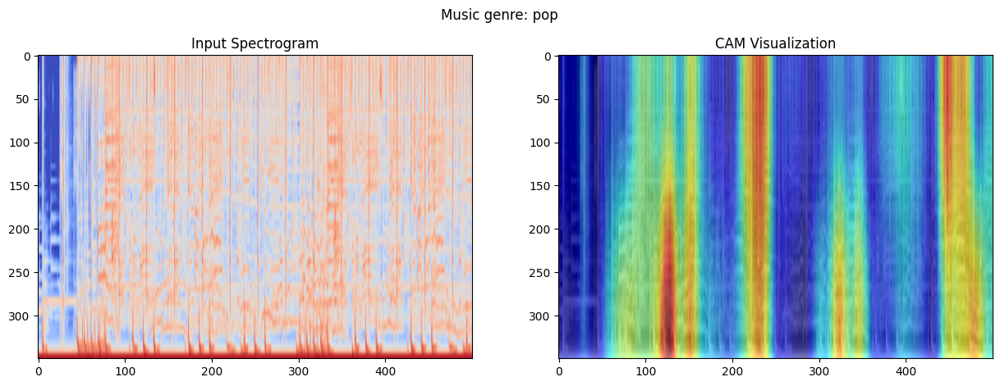

In [ ]:
display_cam_spectrogram(cam_image,
                        image,
                        CFG.labelsMapping[np.argmax(prediction_resnet)])

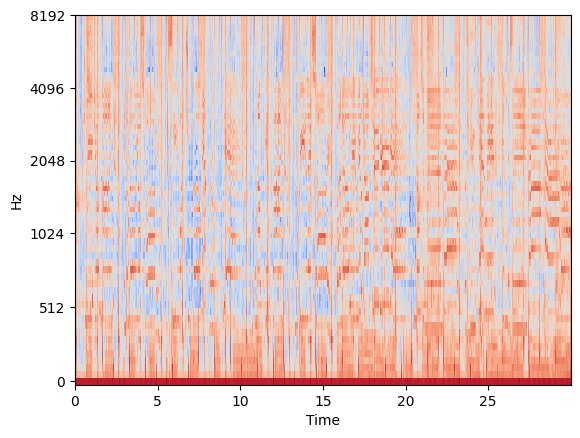

In [ ]:
show_spectrogram(spec)